## Assignment 8
### Name : Shruthi Ramu
### Student ID : 029368922


#### F. (25 points) Implement a Python program imageFinder.py.
• Input: An image of a celebrity in the selected dataset.<br>
• Intermediate steps<br>
1. Using image2vect.py, compute Euclidean distances between the embedding vector of the input image and the embedding vectors of other images
in the selected dataset. You will have 1, 199 Euclidean distances.<br>
2. Consider a hyper-parameter τ . The other images will be recognized as the
same celebrity of the input image if the Euclidean distance is less than τ .<br>
• Output: A list of image files recognized as the same celebrity of the input
image.


#### Import Packages And Libraries

In [1]:
import numpy as np
import hub
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch
from torchsummary import summary
import torchvision.models as models
import glob
from tqdm import tqdm
from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
print(hub.__version__)

3.0.18


In [3]:
print(torch.__version__)

1.13.0


 <b>Resized Dataset<b>

In [4]:
# create dataloader with required transforms 
tc = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()              
    ])

In [5]:
data_dir = '/Users/macuser/Documents/CSULB/Fall2022/AdvancedArtificialIntelligence/TryJupyter/Develop-face-recognition-software-using-pre-trained-YOLO-V3-and-Facenet-model./Selected_Dataset'
image_datasets = datasets.ImageFolder(data_dir, transform=tc)
dloader = torch.utils.data.DataLoader(image_datasets, batch_size=10, shuffle=False)

#### Length Of Image Datasets

In [6]:
print(len(image_datasets))

1200


#### Creating tensors to store the vector embeddings

torch.Size([256, 256, 3])
tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.2392, 0.1843, 0.1529],
         [0.0000, 0.0000, 0.0000,  ..., 0.2824, 0.2314, 0.1882],
         [0.0000, 0.0000, 0.0000,  ..., 0.2863, 0.2314, 0.1882]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.1608, 0.1098, 0.0863],
         [0.0000, 0.0000, 0.0000,  ..., 0.2039, 0.1608, 0.1216],
         [0.0000, 0.0000, 0.0000,  ..., 0.2039, 0.1608, 0.1216]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         [0.0000, 0.0000, 0.0000

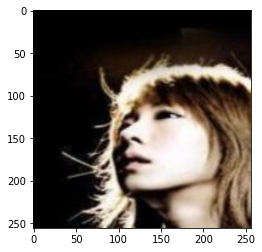

In [7]:
for img, label in dloader:
  print(np.transpose(img[0], (1,2,0)).shape)
  print(img[0])
  plt.imshow((img[0].detach().numpy().transpose(1, 2, 0)*255).astype(np.uint8))
  plt.show()
  break

In [8]:
len(image_datasets)

1200

#### Generate Embeddings

Face embeddings : <font color = 'black'>converting a face image into numerical data.<br>The data is represented as a vector.<br> The closer the embeddings are to each other in the latent space, the more likely they are of the same person.

In [9]:
def copy_embeddings(m, i, o):
    """Copy embeddings from the penultimate layer.
    """
    o = o[:, :, 0, 0].detach().numpy().tolist()
    outputs.append(o)

In [10]:
# fetch pretrained model
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)

Using cache found in /Users/macuser/.cache/torch/hub/pytorch_vision_v0.10.0
/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [11]:
# Select the desired layer
layer = model._modules.get('avgpool')
# attach hook to the penulimate layer
_ = layer.register_forward_hook(copy_embeddings)

In [12]:
outputs = []  # list of embeddings
model.eval() # Inference mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

#### Image embeddings saved in outputs

In [13]:
# Generate image's embeddings for all images in dloader and saves 
# them in the list outputs
for X, y in dloader:
    _ = model(X)

In [14]:
len(outputs)

120

#### Flatten The Embeddings :  <font color='black'>converting the data into a 1-dimensional array for inputting it to the next layer.

In [15]:
# flatten list of embeddings to remove batches
list_embeddings = [item for sublist in outputs for item in sublist]
print(len(list_embeddings))

1200


In [17]:
assert len(list_embeddings) == len(image_datasets)

In [16]:
np.array(list_embeddings[0]).shape

(512,)

In [18]:
len(image_datasets)

1200

#### Printing all the 1199 embeddings

In [19]:
print(outputs)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
print(outputs[0:20])

[[[1.0643776655197144, 0.6393032670021057, 0.20401854813098907, 1.1786608695983887, 0.6398427486419678, 0.8284293413162231, 0.86669921875, 1.5094801187515259, 0.1814790964126587, 1.4187697172164917, 0.21862168610095978, 0.5457354784011841, 0.01993970386683941, 0.42149826884269714, 0.1057366207242012, 0.8234292268753052, 0.10390087217092514, 1.3623113632202148, 0.16265426576137543, 1.811309576034546, 1.048801064491272, 2.9321460723876953, 1.4076446294784546, 0.21397748589515686, 0.5953977704048157, 0.39052051305770874, 0.16314217448234558, 1.845369577407837, 1.7732982635498047, 0.23595429956912994, 0.6391363143920898, 1.9286662340164185, 0.5465449094772339, 1.672037959098816, 0.11206583678722382, 0.49639445543289185, 0.08353894203901291, 0.13649830222129822, 0.19078092277050018, 0.11908186972141266, 0.4692648947238922, 0.5873510241508484, 0.5959820747375488, 1.2144137620925903, 0.6949237585067749, 0.6448344588279724, 0.8108507990837097, 0.7721781730651855, 1.05064058303833, 1.4229595661

In [21]:
print(outputs[21:40])

[[[0.9906095266342163, 0.6545004844665527, 0.9879169464111328, 0.8671121001243591, 0.10691466927528381, 0.8632210493087769, 0.07376871258020401, 0.9014797210693359, 0.5815969705581665, 0.43108677864074707, 0.443741112947464, 0.2681560218334198, 0.04874292388558388, 0.2419814020395279, 0.1027107983827591, 0.509779691696167, 0.10614723712205887, 0.2643519341945648, 0.6137714385986328, 0.7511004209518433, 0.23197142779827118, 0.28005051612854004, 0.49860939383506775, 0.1063263863325119, 0.08129353821277618, 0.532227098941803, 0.7943951487541199, 1.4884132146835327, 0.6318762302398682, 0.23922134935855865, 0.8358123898506165, 1.3031210899353027, 0.672726571559906, 0.36075127124786377, 0.5432610511779785, 0.027463987469673157, 1.3547757863998413, 0.11272576451301575, 1.125110149383545, 0.07501155138015747, 0.4950878620147705, 1.3109662532806396, 0.20055589079856873, 0.472682386636734, 0.4530544877052307, 0.4976385533809662, 0.3427066504955292, 1.0009444952011108, 0.7873297929763794, 1.74863

In [22]:
print(outputs[41:60])

[[[0.16814672946929932, 0.9779918789863586, 1.0107187032699585, 0.3166859745979309, 0.25788432359695435, 0.5180720686912537, 0.08484090119600296, 1.5026426315307617, 0.45831015706062317, 0.14396442472934723, 0.4644041359424591, 0.036919064819812775, 0.00979254487901926, 0.5558463931083679, 0.021954214200377464, 0.9920427203178406, 0.09125618636608124, 0.22792130708694458, 0.5125787854194641, 0.9563589692115784, 0.14915192127227783, 0.5071398019790649, 0.6202511787414551, 0.3590521812438965, 0.09983815997838974, 0.5024034380912781, 0.6640286445617676, 1.600020408630371, 1.3538469076156616, 0.09648018330335617, 0.603495717048645, 0.8941119313240051, 0.6223631501197815, 0.356098473072052, 0.520048975944519, 0.08775249123573303, 0.8556929230690002, 0.040350545197725296, 1.8872226476669312, 0.02293976955115795, 0.2518993318080902, 0.8099223971366882, 0.199527308344841, 0.7325605154037476, 0.4619024097919464, 0.5038642883300781, 0.21713870763778687, 1.2477936744689941, 0.918640673160553, 2.1

In [23]:
print(outputs[61:80])

[[[0.8886362314224243, 0.2951316833496094, 0.6625502109527588, 0.5558524131774902, 0.08737311512231827, 0.5852091908454895, 0.27514055371284485, 0.3546818494796753, 0.4275696873664856, 1.1407265663146973, 0.023882735520601273, 0.7282668352127075, 0.1370786875486374, 0.34371674060821533, 0.062080249190330505, 0.6040939688682556, 0.2998967170715332, 0.24924129247665405, 0.16842353343963623, 0.9082594513893127, 0.11120759695768356, 0.7511048316955566, 0.3505862057209015, 0.2507602870464325, 0.3607732653617859, 0.33506277203559875, 0.17578764259815216, 1.1737704277038574, 2.407142400741577, 0.8595522046089172, 0.2678616940975189, 1.093316912651062, 0.9372445940971375, 0.9032233953475952, 0.20847900211811066, 0.07668788731098175, 1.0351203680038452, 0.16681668162345886, 1.5664801597595215, 0.0893925130367279, 1.1137150526046753, 0.9802641272544861, 0.5732200145721436, 0.5107511281967163, 0.5801916122436523, 0.38182875514030457, 0.3344104588031769, 3.508958578109741, 0.22711718082427979, 1.8

In [24]:
print(outputs[81:100])

[[[1.861619234085083, 0.5295816659927368, 0.3101842701435089, 1.1786580085754395, 0.6321718096733093, 1.1188011169433594, 0.2818042039871216, 1.0914926528930664, 0.40277600288391113, 0.4862109422683716, 0.5602374076843262, 0.22364172339439392, 0.023396141827106476, 0.23565351963043213, 0.3653062582015991, 0.1592532843351364, 0.04403210058808327, 0.28961625695228577, 0.1492449790239334, 0.6644629836082458, 0.2941206097602844, 0.7707705497741699, 0.7789093255996704, 0.24745512008666992, 0.14969365298748016, 0.023636478930711746, 0.18832354247570038, 0.9750775098800659, 2.0406816005706787, 0.07099636644124985, 0.6845268607139587, 2.9939444065093994, 0.7590368390083313, 0.8207285404205322, 0.8434513807296753, 0.08109869807958603, 0.9093918204307556, 0.06473417580127716, 0.44085559248924255, 0.2930578887462616, 1.2585757970809937, 0.22426056861877441, 0.6195991635322571, 0.26143890619277954, 0.3775736689567566, 1.114973783493042, 0.214074045419693, 1.9277374744415283, 1.8766289949417114, 1.

In [25]:
print(outputs[101:120])

[[[0.31664955615997314, 0.23503172397613525, 0.2669641375541687, 0.7253814339637756, 0.05257389321923256, 0.3528836965560913, 0.01528717577457428, 0.3311668634414673, 0.2586458623409271, 0.5155417919158936, 0.07650107890367508, 0.1641126275062561, 0.0580095611512661, 0.13870850205421448, 0.4929133653640747, 0.5747970938682556, 0.05988956242799759, 0.505843997001648, 0.21647243201732635, 0.6063032746315002, 0.10143928974866867, 0.530164897441864, 0.3698578178882599, 0.059989117085933685, 0.1296737641096115, 0.03306611627340317, 0.3634223937988281, 0.9412389993667603, 0.9024197459220886, 0.03732279688119888, 0.14434076845645905, 1.219010591506958, 0.39612314105033875, 0.5792204737663269, 0.08580339699983597, 0.0, 0.980498194694519, 0.2550462782382965, 1.0316113233566284, 0.09891444444656372, 0.4473634362220764, 0.4074004292488098, 0.3524693250656128, 0.3383740782737732, 0.6030283570289612, 0.1309751719236374, 0.37459132075309753, 0.4450141191482544, 1.305323600769043, 2.12043833732605, 1

In [26]:
print(len(list_embeddings))

1200


<b>Embeddings of 1st cropped image from the selected dataset that we have created. <b>

In [27]:
print(list_embeddings[0])

[1.0643776655197144, 0.6393032670021057, 0.20401854813098907, 1.1786608695983887, 0.6398427486419678, 0.8284293413162231, 0.86669921875, 1.5094801187515259, 0.1814790964126587, 1.4187697172164917, 0.21862168610095978, 0.5457354784011841, 0.01993970386683941, 0.42149826884269714, 0.1057366207242012, 0.8234292268753052, 0.10390087217092514, 1.3623113632202148, 0.16265426576137543, 1.811309576034546, 1.048801064491272, 2.9321460723876953, 1.4076446294784546, 0.21397748589515686, 0.5953977704048157, 0.39052051305770874, 0.16314217448234558, 1.845369577407837, 1.7732982635498047, 0.23595429956912994, 0.6391363143920898, 1.9286662340164185, 0.5465449094772339, 1.672037959098816, 0.11206583678722382, 0.49639445543289185, 0.08353894203901291, 0.13649830222129822, 0.19078092277050018, 0.11908186972141266, 0.4692648947238922, 0.5873510241508484, 0.5959820747375488, 1.2144137620925903, 0.6949237585067749, 0.6448344588279724, 0.8108507990837097, 0.7721781730651855, 1.05064058303833, 1.422959566116

In [28]:
print(len(list_embeddings[0]))

512


<b>Embeddings of 2nd cropped image from the selected dataset that we have created. <b>

In [29]:
print(list_embeddings[1])

[0.3380310535430908, 0.8740859627723694, 0.0540633350610733, 0.7666638493537903, 0.25337374210357666, 0.5424567461013794, 0.26565200090408325, 0.9449870586395264, 0.3351428210735321, 0.487718403339386, 1.6877185106277466, 0.09048891067504883, 0.23658904433250427, 0.9615925550460815, 0.07388174533843994, 0.7984603047370911, 0.2701076865196228, 0.381099671125412, 0.5813599824905396, 0.8778246641159058, 0.6564746499061584, 0.7868782877922058, 0.8023138642311096, 0.5144101977348328, 0.2722909450531006, 0.2170867621898651, 0.2220962792634964, 2.300299882888794, 1.451061487197876, 0.08784382045269012, 0.6812145709991455, 1.4707919359207153, 0.5965228080749512, 1.1667046546936035, 0.42889392375946045, 0.36158308386802673, 0.4212196171283722, 0.0730934888124466, 1.0049850940704346, 0.007857214659452438, 0.1721295714378357, 1.204139232635498, 0.32560497522354126, 0.5032450556755066, 1.457945704460144, 0.48559626936912537, 0.26101475954055786, 0.9355103969573975, 1.6545159816741943, 1.5738008022

<b>Embeddings of 3rd cropped image from the selected dataset that we have created.<b>

In [30]:
print(list_embeddings[2])

[1.7795706987380981, 0.398767352104187, 1.0249664783477783, 0.26018816232681274, 0.11490869522094727, 0.5487214922904968, 0.16395236551761627, 0.561410129070282, 0.9130628108978271, 1.3882817029953003, 0.13634903728961945, 0.48524022102355957, 0.36758026480674744, 0.43971535563468933, 0.46336618065834045, 0.35511112213134766, 0.0047988188453018665, 0.22454024851322174, 0.27865955233573914, 0.7056989669799805, 0.5814353823661804, 0.02955029159784317, 0.532641589641571, 0.29745742678642273, 0.1289086788892746, 0.019889021292328835, 0.613286554813385, 2.058765172958374, 0.5970562100410461, 0.08102090656757355, 0.44029295444488525, 0.4771193563938141, 1.027682900428772, 1.1883336305618286, 1.632885456085205, 0.021267740055918694, 1.5610517263412476, 0.3939456045627594, 0.7254416942596436, 0.1556604653596878, 0.014015357941389084, 1.6625452041625977, 0.42053160071372986, 1.2518171072006226, 0.8258874416351318, 0.7087375521659851, 1.1553871631622314, 1.879543662071228, 1.7223225831985474, 1.

#### Image Embeddings Vectors of 1200 cropped images from the Selected Dataset. <br>Each embedding vector has a length of 512.<br> 1 * 512 vector <br>1 * 512 * 1200 

In [31]:

# using for loop
a = list_embeddings
  
# printing the list using loop
for x in range(len(a)):
    print (a[x])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[0.43595704436302185, 0.7329142093658447, 0.5969014763832092, 0.9234755635261536, 0.1639285832643509, 0.10276533663272858, 0.00876628514379263, 0.6306678056716919, 0.375539094209671, 0.2833546996116638, 0.2504640221595764, 0.03040720894932747, 0.13879135251045227, 0.8779937028884888, 0.16387760639190674, 0.6858112812042236, 0.0489175021648407, 0.9562209844589233, 0.02863941714167595, 0.9036063551902771, 0.06348615884780884, 0.34129905700683594, 0.6456966996192932, 0.2405356615781784, 0.254893958568573, 0.37939226627349854, 0.5209476947784424, 0.9867697954177856, 0.8738033175468445, 0.1483485847711563, 0.28032904863357544, 0.6276899576187134, 0.2893643081188202, 0.18917736411094666, 0.504795491695404, 0.25620248913764954, 1.2502164840698242, 0.013138961046934128, 0.6646953821182251, 0.2181204855442047, 0.2451927363872528, 1.0870286226272583, 0.8155837059020996, 1.1279253959655762, 0.5533879399299622, 0.1950671672821045, 0.11760837584733963, 0.3809555470943451, 0.6204997301101685, 2.286

#### 1199 Euclidean distances 
The indexing starts from zero and ends on 1200-1 therefore we get 1199 Euclidean distances. 

In [32]:
from scipy.spatial import distance

In [33]:

# using for loop
a = list_embeddings
  
# printing the list using loop
for x in range(len(a)):
    print(distance.euclidean(a[x],a[x-1]))

15.28485881504438
13.35721929178386
11.031167599452054
11.948113562224725
12.387058580084203
14.535640898028557
15.111576263999943
10.517593604597709
11.994953974507853
11.453654329706369
15.525181538857773
13.229292483071283
14.974977732904549
14.78304546156608
11.14347416281552
12.781263938074154
12.092760595850208
12.03230603925178
13.245049767307782
14.5385680286366
13.817817599253079
13.891897358529873
12.899725462389203
11.93263493756424
13.246050452701192
10.046328878285264
11.966149062301596
14.557027139064113
15.642039691720418
13.569980332341745
12.588290797690297
12.530248682162068
13.675228830120249
8.816507467941964
9.367885564190717
7.988955430859259
10.293575226060138
10.516603313072796
10.956320135239844
11.604417332459624
9.038979815493734
8.0672916585713
8.209546676835105
8.562906276941217
13.766262627386913
12.722642945083583
9.699028843770762
9.06232800103299
11.97452547445254
11.924921597920285
16.027598980679556
17.61983029326174
8.81278133617158
8.394709044816484

18.30173482348878
16.138010503113826
11.656666043060683
11.575453028542888
12.180524446610137
13.303281511025581
12.715161143749652
13.209321359031383
13.171534340461164
13.259724591828872
11.043177937922165
12.984738876969233
14.634553389809739
11.438216310304753
17.00922145794223
16.227809647436164
13.398202798676975
11.707517807694948
11.917300132672938
15.15618080476233
10.553152222910514
13.677260275061592
12.465910779582364
11.920216456585024
12.128461748011114
8.301086124383405
10.423959271936512
13.03414970085452
12.180770019862832
9.580953340939605
11.33224777553396
12.880698492249081
13.891571110920694
11.682228612804655
13.88325066394156
14.825107933979638
13.766390264774772
14.706417788959275
12.857501580447684
9.53223295779851
10.747030691212002
12.603678050633658
11.859990159371842
13.280322731793047
12.131879560299488
13.399501291950262
12.814601991990518
10.872485163102398
10.976741405101153
14.439664039208925
9.987806255047515
8.620173030733959
10.429286237757609
9.944

In [34]:
print(len(a))

1200


#### Such large embeddings won't fit locally hence, we need to migrate them on the cloud.

In [35]:
!activeloop login -u shruthiramu -p Plko0987*

Successfully logged in to Activeloop.


In [42]:
import hub

platform_path = 'hub://shruthiramu/1200_selected_celebs_embeddings'
               
               
ds = hub.dataset(platform_path)

hub://shruthiramu/1200_selected_celebs_embeddings loaded successfully.
This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/shruthiramu/1200_selected_celebs_embeddings


In [45]:
hub_celeb_embeddings_path = 'hub://shruthiramu/1200_select_finalcelebas_embeddings_1'

In [46]:
with hub.empty(hub_celeb_embeddings_path) as ds:
    # Create the tensors 
    ds.create_tensor('images', htype = 'image', sample_compression = 'jpeg')
    ds.create_tensor('embeddings')

    # Add arbitrary metadata - Optional
    ds.info.update(description = '1200 Celebrities Embeddings dataset')
    ds.images.info.update(camera_type = 'SLR')
    
    # Iterate through the images and their corresponding embeddings, and append them to hub dataset
    for i in tqdm(range(len(image_datasets))):
      img = image_datasets[i][0].detach().numpy().transpose(1, 2, 0)
      img = img * 255 # images are normalized
      img = img.astype(np.uint8)
      ds.images.append(img)  # Append to Hub Dataset
      ds.embeddings.append(list_embeddings[i]) # Append to Hub Dataset
                

Your Hub dataset has been successfully created!
The dataset is private so make sure you are logged in!
This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/shruthiramu/1200_select_finalcelebas_embeddings_1


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1200/1200 [00:12<00:00, 95.22it/s]


#### Image and its embeddings shown

Image:
(256, 256, 3)


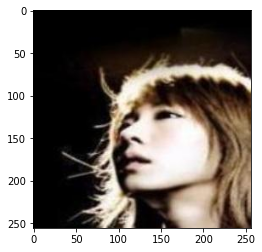

[1.06437767 0.63930327 0.20401855 1.17866087 0.63984275 0.82842934
 0.86669922 1.50948012 0.1814791  1.41876972]
Image:
(256, 256, 3)


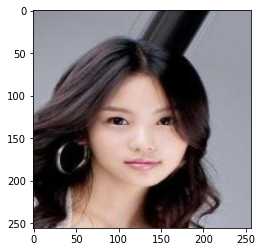

[0.33803105 0.87408596 0.05406334 0.76666385 0.25337374 0.54245675
 0.265652   0.94498706 0.33514282 0.4877184 ]


In [47]:
def show_image_in_ds(ds, idx=1):
    image = ds.images[idx].numpy()
    embedding = ds.embeddings[idx].numpy()
    print("Image:")
    print(image.shape)
    plt.imshow(image)
    plt.show()
    print(embedding[0:10]) # show only 10 first values of the image embedding

for i in range(2):
    show_image_in_ds(ds, i)

<b>Check the dataset was correctly sent to Hub<b>

hub://shruthiramu/1200_select_finalcelebas_embeddings_1 loaded successfully.
This dataset can be visualized in Jupyter Notebook by ds.visualize() or at https://app.activeloop.ai/shruthiramu/1200_select_finalcelebas_embeddings_1


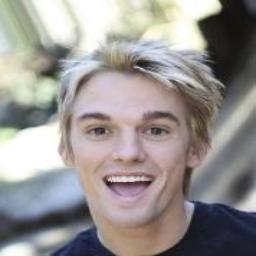

In [48]:
ds_from_hub = hub.dataset(hub_celeb_embeddings_path)
Image.fromarray(ds_from_hub.images[47].numpy())

Image:
(256, 256, 3)


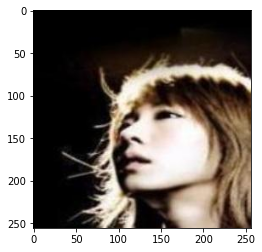

[1.06437767 0.63930327 0.20401855 1.17866087 0.63984275 0.82842934
 0.86669922 1.50948012 0.1814791  1.41876972]
Image:
(256, 256, 3)


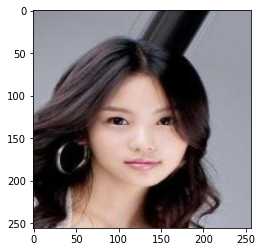

[0.33803105 0.87408596 0.05406334 0.76666385 0.25337374 0.54245675
 0.265652   0.94498706 0.33514282 0.4877184 ]


/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/deeplake/core/tensor.py:600: UserWarning: Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead.
  "Indexing by integer in a for loop, like `for i in range(len(ds)): ... ds.tensor[i]` can be quite slow. Use `for i, sample in enumerate(ds)` instead."


Image:
(256, 256, 3)


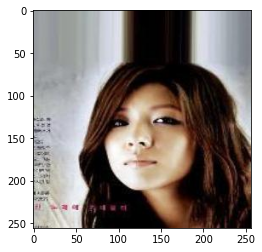

[1.7795707  0.39876735 1.02496648 0.26018816 0.1149087  0.54872149
 0.16395237 0.56141013 0.91306281 1.3882817 ]
Image:
(256, 256, 3)


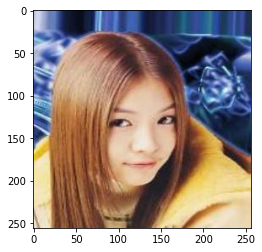

[1.04473615 0.40311041 0.91277802 0.58317703 0.21775547 0.72452861
 0.02948051 0.97218549 0.69316185 0.48090446]
Image:
(256, 256, 3)


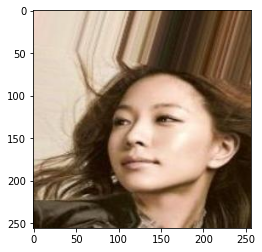

[0.17456801 0.50270891 0.50931418 0.74151778 0.18233815 0.19454026
 0.38863271 1.71017611 0.30847722 0.90242803]
Image:
(256, 256, 3)


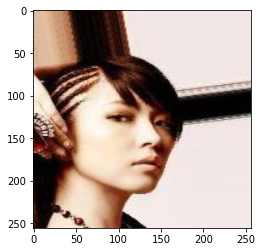

[1.07181764 0.08315126 0.68073845 0.62036341 1.431988   0.63437146
 0.20113182 0.26728743 0.46553868 0.67235053]
Image:
(256, 256, 3)


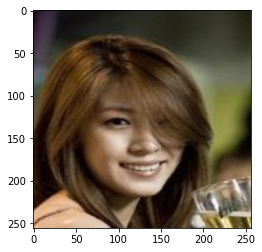

[0.04998508 0.36749408 0.37975448 0.97609055 0.15099533 0.51017112
 0.11304588 0.71544462 0.40665063 0.13978569]
Image:
(256, 256, 3)


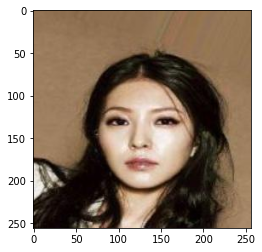

[1.0747956  0.47400585 0.08758141 0.67160523 0.14048873 0.27319229
 0.9799124  0.98354667 0.42287815 0.34944543]
Image:
(256, 256, 3)


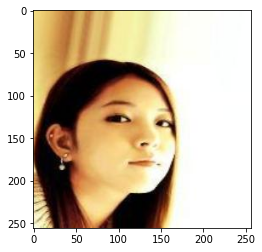

[1.65159154 0.43535247 0.04005215 0.43336421 0.17667609 0.36288339
 0.18900608 0.9793759  0.31139401 1.27026427]
Image:
(256, 256, 3)


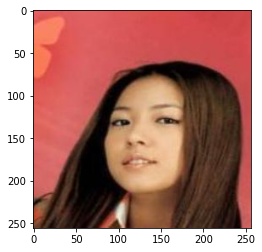

[2.16720557 0.3030442  0.02300203 1.19960439 0.14851961 1.3205018
 0.21537082 1.1806761  0.78044403 1.01674402]


In [49]:
for i in range(10):
    show_image_in_ds(ds_from_hub, i)